In [2]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
import cmocean
import pandas as pd

In [3]:
# Load the data of 2009
data_2009 = pd.read_pickle('../../data/2009_df.pkl')
data_e6_1958 = pd.read_pickle('../../../../../../../Volumes/T7 Shield/exp_6/ORCA025.L46.LIM2vp.CFCSF6.MOPS.JRA.L.LP03-KLP004_1958_df.pkl')

# Reduce to month of January
# january = data_2009[data_2009['time_centered'] == '2009-01-16 12:00:00']

# Filter longitude values between 0.98 and 1.02
# longitude_1 = january[(january['nav_lon'] >= 0.9) & (january['nav_lon'] <= 1.1)]
# filtered_lon_1.describe()

In [4]:
data_e6_1958.describe()

,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,...,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
count,1.766738e+07,1.766738e+07,17667384,1.766738e+07,1.766738e+07,17667384,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,...,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07
mean,5.100000e+02,7.205000e+02,1958-07-01 17:00:00.000001280,5.263826e-01,-1.061720e+00,1958-07-01 17:00:00.000001280,7.315716e+00,6.141242e-01,1.767752e+04,1.682089e+04,...,-4.785676e+00,3.051496e+16,1.290798e-02,1.436837e-04,7.546129e-03,8.013132e-04,2.709020e+08,2.709020e+08,1.197037e-01,2.255400e-01
min,0.000000e+00,0.000000e+00,1958-01-16 12:00:00,-7.701048e+01,-1.800000e+02,1958-01-16 12:00:00,-2.006332e+00,0.000000e+00,1.459272e-01,3.068849e-08,...,-1.189679e+03,-3.181927e-01,-6.268422e-01,-4.603371e-01,-1.643251e+00,-2.619796e+00,2.113851e+01,2.291548e+01,-4.195361e+01,-4.418707e+01
25%,2.550000e+02,3.600000e+02,1958-04-08 09:00:00,-5.179231e+01,-9.507876e+01,1958-04-08 09:00:00,0.000000e+00,0.000000e+00,1.232506e+04,1.085933e+04,...,-1.514609e+01,-8.908163e-06,-5.306969e-03,-7.222291e-03,-3.313376e-03,-2.574632e-03,2.718362e+02,2.987828e+02,-1.072039e-01,-3.058949e-02
50%,5.100000e+02,7.205000e+02,1958-07-01 06:00:00,2.998630e+00,2.250000e+00,1958-07-01 06:00:00,0.000000e+00,1.000000e+00,1.716295e+04,1.584644e+04,...,0.000000e+00,2.512596e-05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.040693e+02,3.311463e+02,-0.000000e+00,-0.000000e+00
75%,7.650000e+02,1.081000e+03,1958-09-23 15:00:00,5.048521e+01,8.450333e+01,1958-09-23 15:00:00,1.535690e+01,1.000000e+00,2.400720e+04,2.375030e+04,...,1.002059e+01,7.928241e+16,2.077815e-02,7.242747e-03,7.703913e-03,4.920341e-03,7.020444e+08,7.020444e+08,1.886107e-01,3.613103e-01
max,1.020000e+03,1.441000e+03,1958-12-16 12:00:00,8.994787e+01,1.800000e+02,1958-12-16 12:00:00,3.459549e+01,1.000000e+00,2.779973e+04,2.779973e+04,...,2.968239e+02,7.928241e+16,4.850108e-01,5.042013e-01,1.775772e+00,2.092475e+00,7.020444e+08,7.020444e+08,1.366783e+01,1.534322e+01
std,2.947372e+02,4.162695e+02,NaN,5.205579e+01,1.026087e+02,NaN,1.071165e+01,4.868015e-01,6.683536e+03,7.174737e+03,...,7.318744e+01,3.857591e+16,6.258493e-02,3.211726e-02,8.719955e-02,5.832049e-02,3.417561e+08,3.417561e+08,1.090638e+00,1.147617e+00


In [8]:
data_e6_1958['basin'].describe()

count     16947132
unique           5
top          OTHER
freq       8783520
Name: basin, dtype: object

In [6]:
df1 = data_2009
df2 = data_e6_1958

# Step 1: Basic info
print("Shape of df1:", df1.shape)
print("Shape of df2:", df2.shape)

# Step 2: Column differences
print("Columns in df1 not in df2:", set(df1.columns) - set(df2.columns))
print("Columns in df2 not in df1:", set(df2.columns) - set(df1.columns))

# Step 3: Index differences
print("Rows in df1 not in df2:")
print(df1.index.difference(df2.index))

print("Rows in df2 not in df1:")
print(df2.index.difference(df1.index))

Shape of df1: (17667384, 23)
Shape of df2: (17667384, 24)
Columns in df1 not in df2: set()
Columns in df2 not in df1: {'basin'}
Rows in df1 not in df2:
RangeIndex(start=0, stop=0, step=1)
Rows in df2 not in df1:
RangeIndex(start=0, stop=0, step=1)


/var/folders/ns/4sxfm4t95836d2h_1wgqvzdh0000gn/T/ipykernel_96388/3426944799.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  longitude_1['diff'] = longitude_1['nav_lat'].shift(-1) - longitude_1['nav_lat']


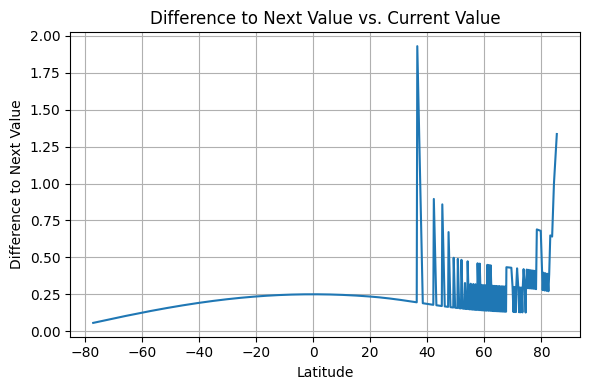

In [71]:
# Calculate the difference between each latitude value and the next one
longitude_1['diff'] = longitude_1['nav_lat'].shift(-1) - longitude_1['nav_lat']

# Drop the last row (since its diff is NaN)
df_plot = longitude_1[:-1]
df_plot = df_plot[['nav_lat', 'diff']]
# df_plot = df_plot[::10]

# Plotting
plt.figure(figsize=(6, 4))
plt.plot(df_plot['nav_lat'], df_plot['diff'])
plt.xlabel('Latitude')
plt.ylabel('Difference to Next Value')
plt.title('Difference to Next Value vs. Current Value')
plt.grid(True)
plt.tight_layout()
plt.show()


In [32]:
from utils.ocean_basins import get_zoned_df

features = ['SST', 'SAL', 'ice_frac', 'mixed_layer_depth', 'heat_flux_down', 'water_flux_up', 'stress_X', 'stress_Y', 'currents_X', 'currents_Y','fco2','fco2_pre','co2flux','co2flux_pre']

# data_1960 = pd.read_pickle('../../../../../../../Volumes/T7 Shield/exp_1/ORCA025.L46.LIM2vp.CFCSF6.MOPS.JRA.LP04-KLP002.hind_1960_df.pkl')
# data_2015 = pd.read_pickle('../../../../../../../Volumes/T7 Shield/exp_1/ORCA025.L46.LIM2vp.CFCSF6.MOPS.JRA.LP04-KLP002.hind_2015_df.pkl')
# data_1960["month"] = data_1960["time_counter"].apply(lambda x: x.month)
# data_2015["month"] = data_2015["time_counter"].apply(lambda x: x.month)

months = [1,4,7,10]
month_labels = ['','January','','','April','','','July','','','October','','']
region_labels = ['Arctic','North Atlantic','Equatorial Pacific','Southern Ocean']

# datasets = {
#     "1960": data_1960,
#     "2015": data_2015
# }



/Users/jakobmeggendorfer/Documents/CAU/Masterarbeit/master-thesis/notebooks/utils/ocean_basins.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_ARCTIC['zone'] = 'ARCTIC'
/Users/jakobmeggendorfer/Documents/CAU/Masterarbeit/master-thesis/notebooks/utils/ocean_basins.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_SOUTHERN_OCEAN['zone'] = 'SOUTHERN_OCEAN'


Arctic
January
Arctic
April
Arctic
July
Arctic
October
North Atlantic
January
North Atlantic
April
North Atlantic
July
North Atlantic
October
Equatorial Pacific
January
Equatorial Pacific
April
Equatorial Pacific
July
Equatorial Pacific
October
Southern Ocean
January
Southern Ocean
April
Southern Ocean
July
Southern Ocean
October


/Users/jakobmeggendorfer/Documents/CAU/Masterarbeit/master-thesis/notebooks/utils/ocean_basins.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_ARCTIC['zone'] = 'ARCTIC'
/Users/jakobmeggendorfer/Documents/CAU/Masterarbeit/master-thesis/notebooks/utils/ocean_basins.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_SOUTHERN_OCEAN['zone'] = 'SOUTHERN_OCEAN'


Arctic
January
Arctic
April
Arctic
July
Arctic
October


/var/folders/ns/4sxfm4t95836d2h_1wgqvzdh0000gn/T/ipykernel_66851/1391667145.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


North Atlantic
January
North Atlantic
April
North Atlantic
July
North Atlantic
October
Equatorial Pacific
January
Equatorial Pacific
April
Equatorial Pacific
July
Equatorial Pacific
October
Southern Ocean
January
Southern Ocean
April
Southern Ocean
July
Southern Ocean
October


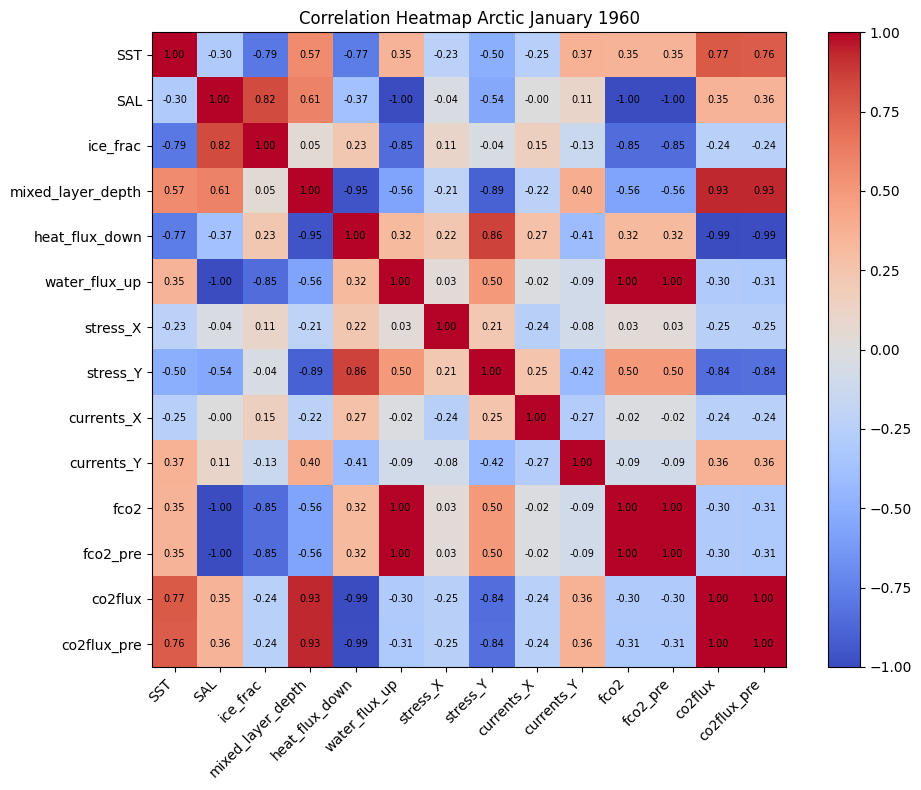

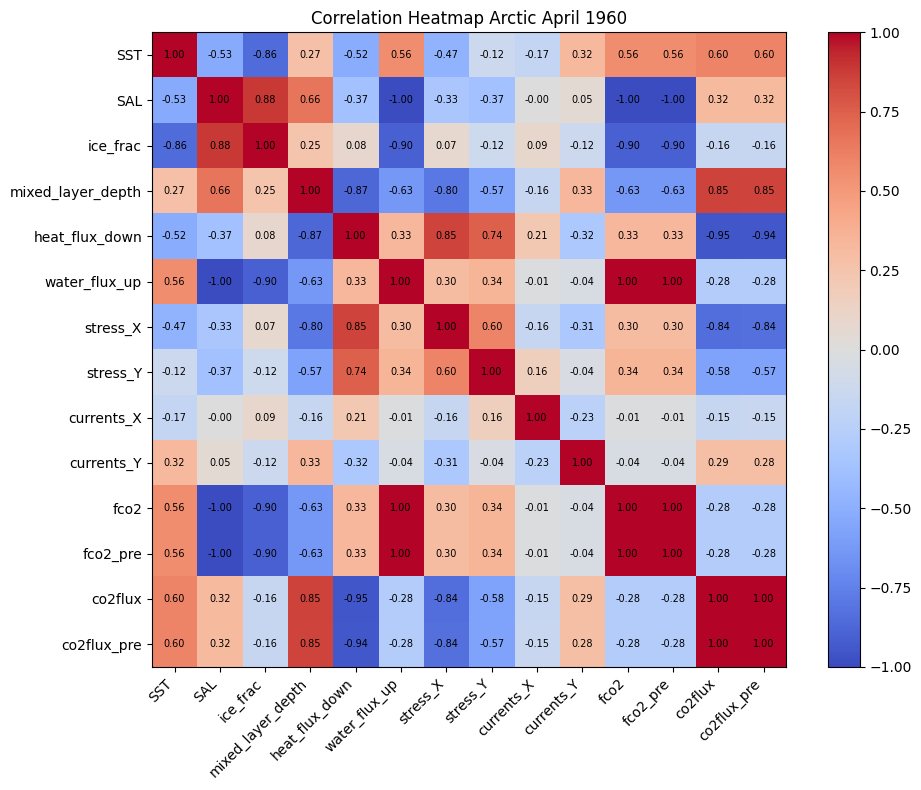

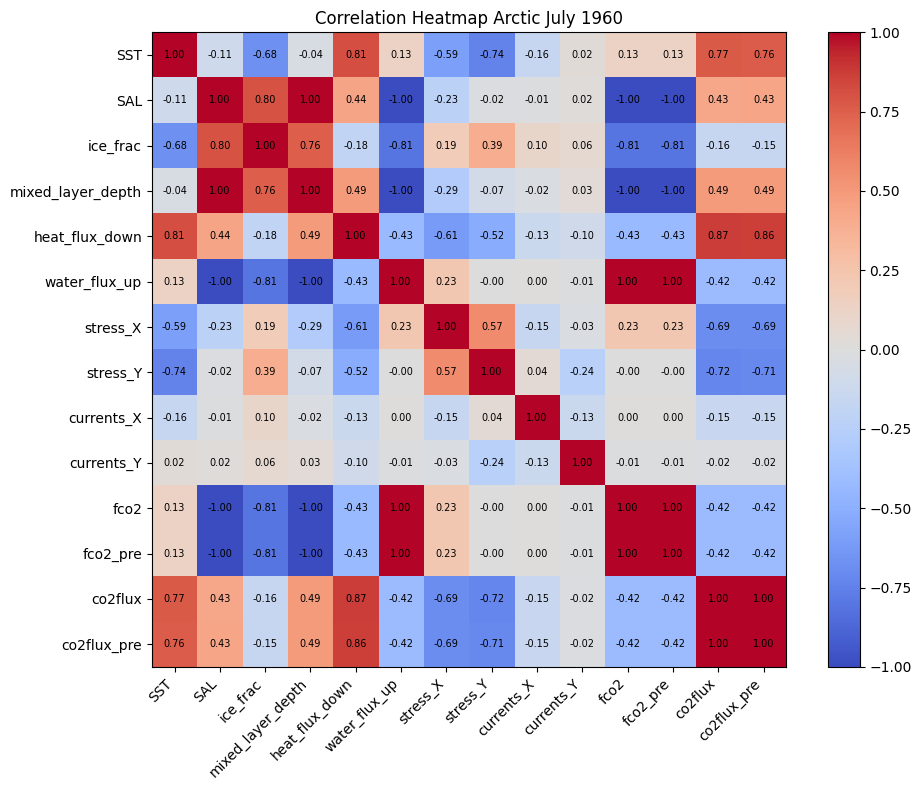

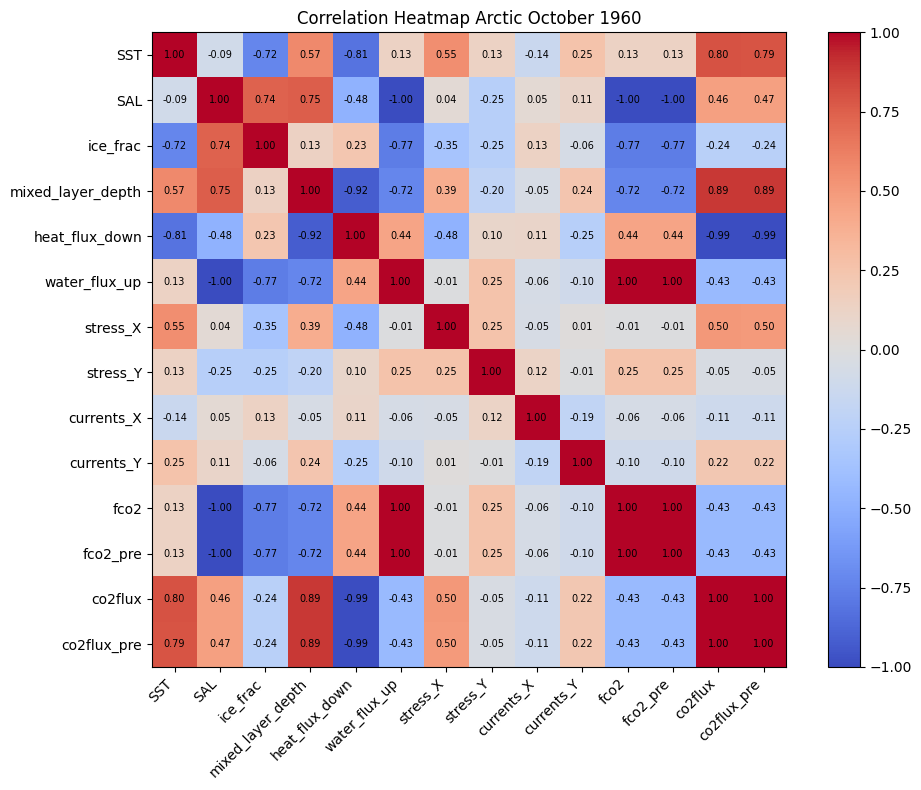

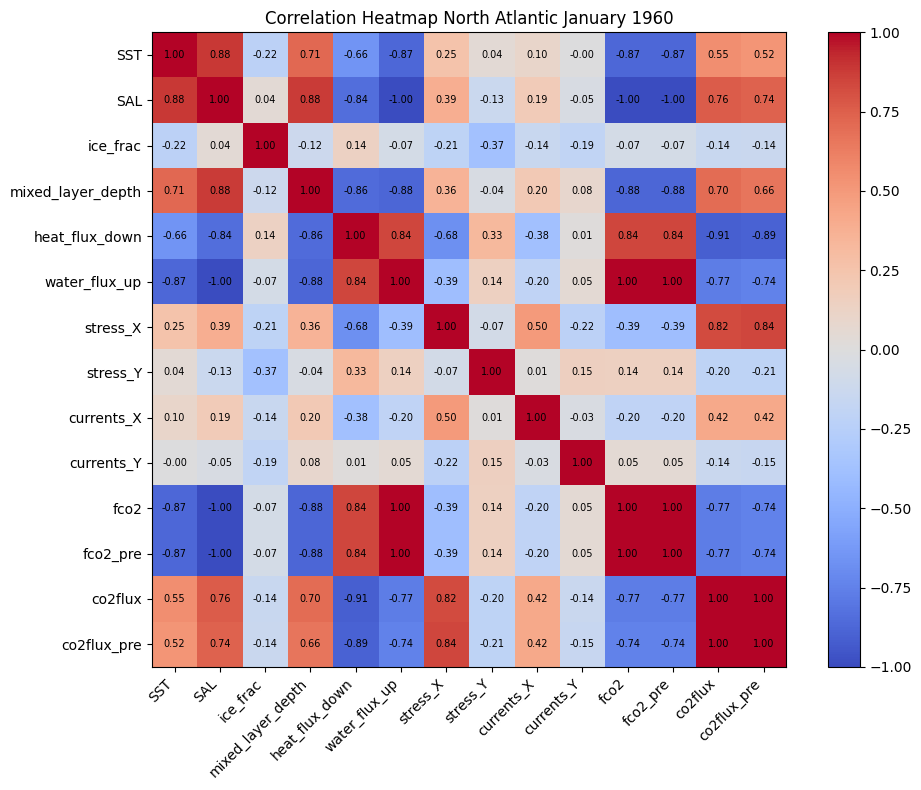

...

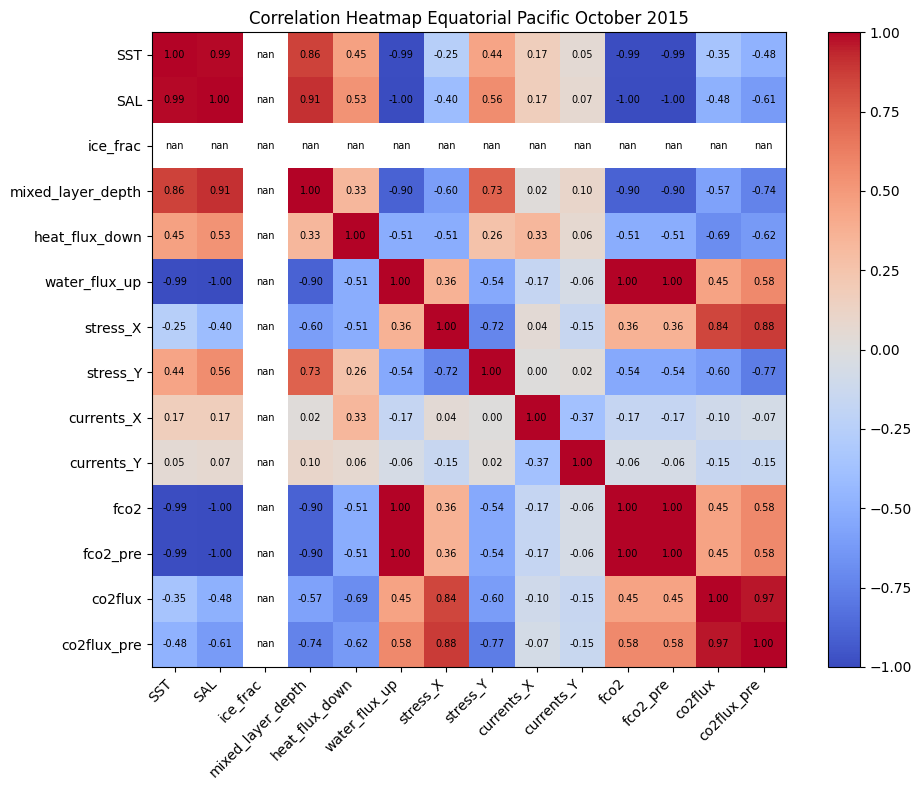

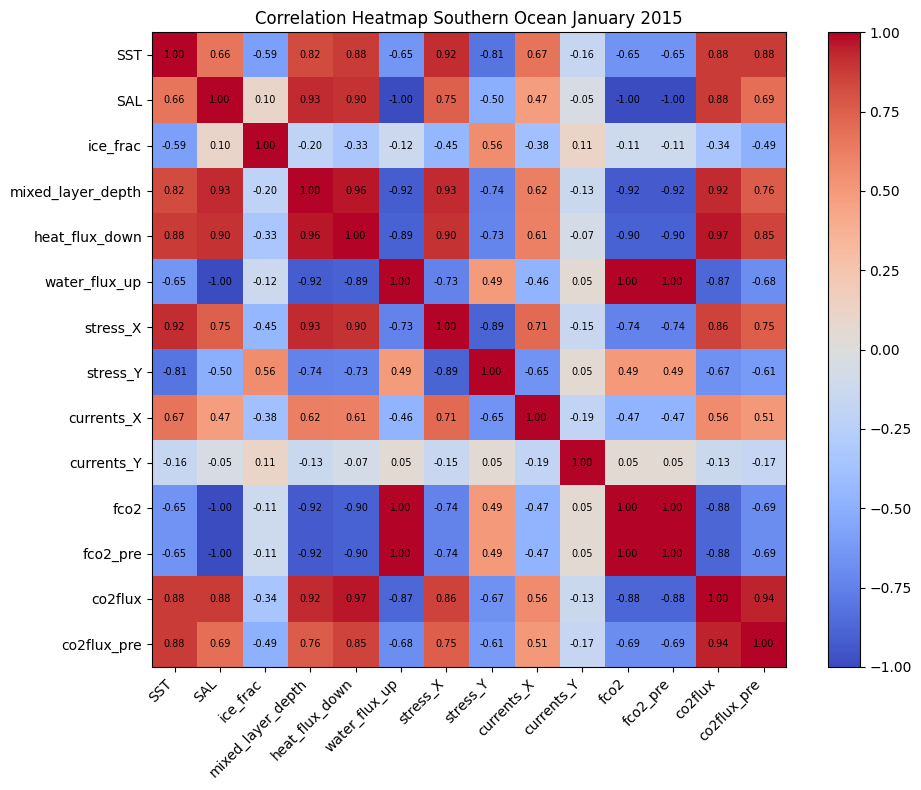

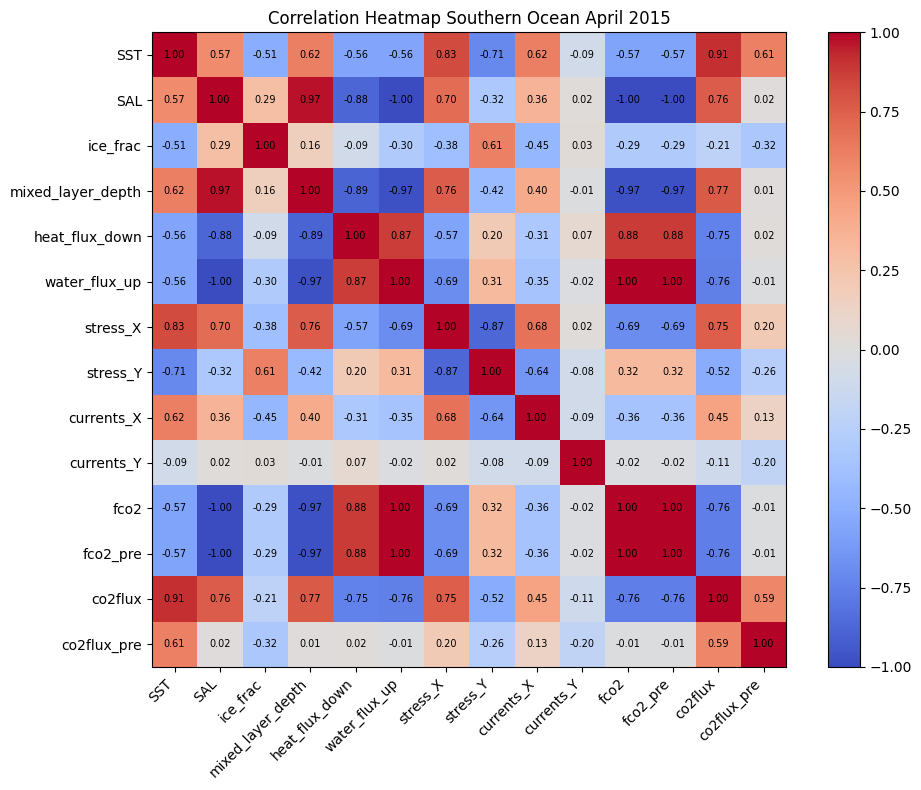

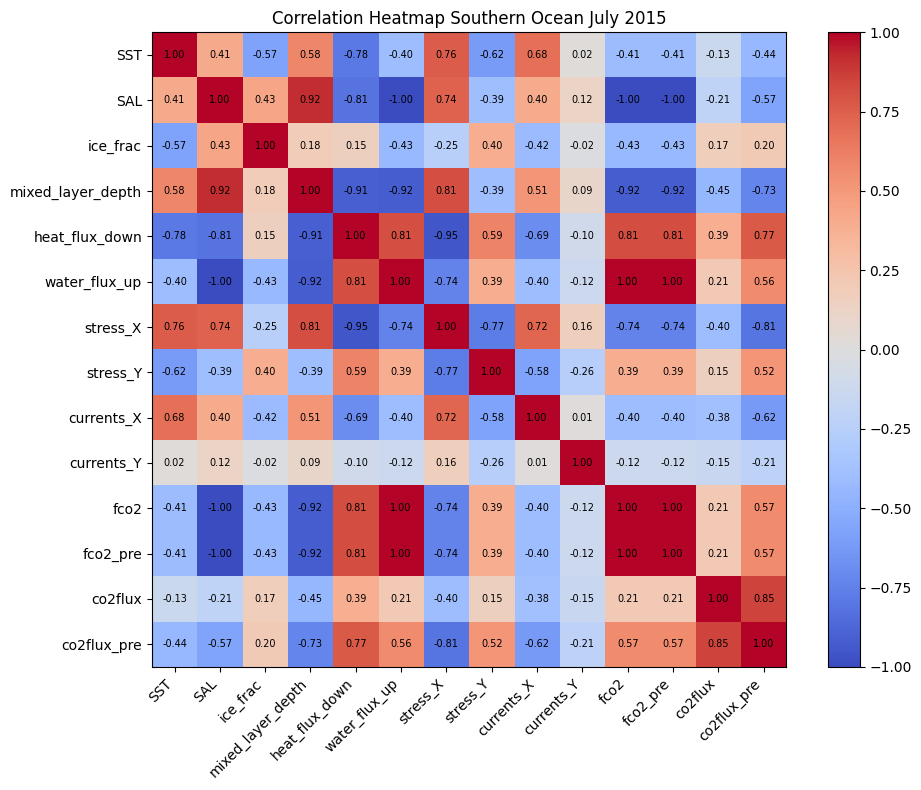

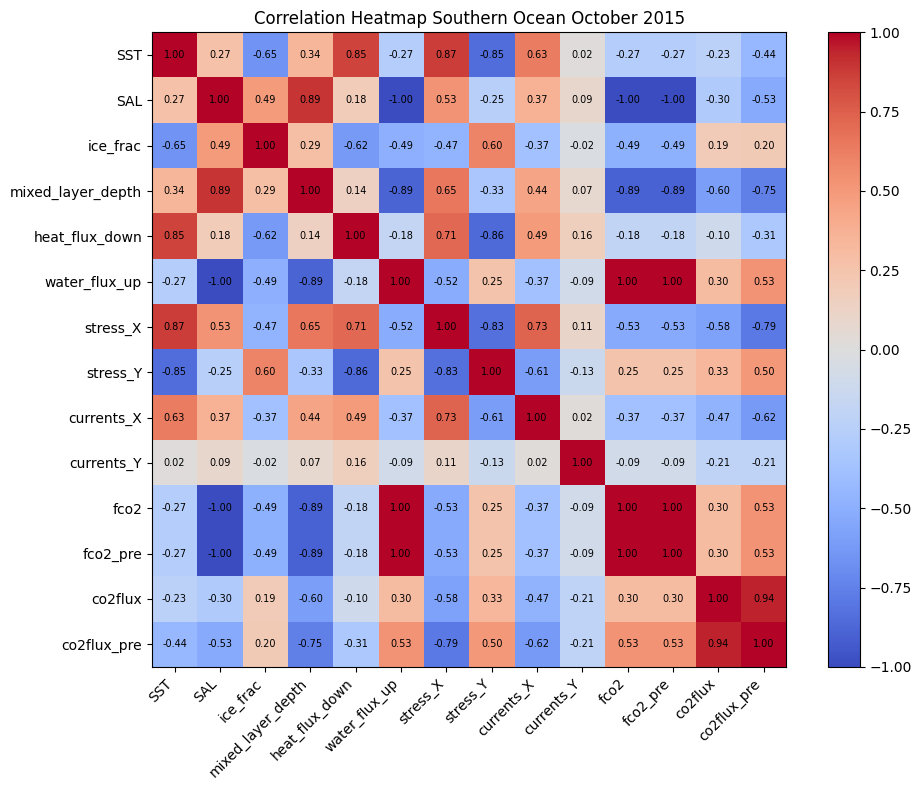

In [33]:
for year_label, df in datasets.items():
    regions = get_zoned_df(df)  # returns a list of 4 DataFrames

    for region_idx, region_df in enumerate(regions):
        for month in months:
            # Filter by month
            month_df = region_df[region_df['month'] == month]
            corr_df = month_df[features].corr().loc[features, features]

           # Compute correlation matrix
            corr_matrix = corr_df.corr()

            # Plot heatmap
            fig, ax = plt.subplots(figsize=(10, 8))
            cax = ax.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)

            # Add colorbar
            fig.colorbar(cax)

            # Set ticks
            ax.set_xticks(np.arange(len(features)))
            ax.set_yticks(np.arange(len(features)))
            ax.set_xticklabels(features, rotation=45, ha='right')
            ax.set_yticklabels(features)

            # Add correlation values in the cells
            for i in range(len(features)):
                for j in range(len(features)):
                    text = f"{corr_matrix.iloc[i, j]:.2f}"
                    ax.text(j, i, text, ha='center', va='center', color='black', fontsize=7)

            print(region_labels[region_idx])
            print(month_labels[month])

            ax.set_title("Correlation Heatmap " + region_labels[region_idx] + " " + month_labels[month] + " " + year_label)
            plt.tight_layout()
            plt.savefig("../plots/general/heatmaps/heatmap_" + region_labels[region_idx] + "_" + month_labels[month] + "_" + year_label + ".png", dpi=300, bbox_inches='tight')

In [25]:
# data = data_2015[data_2015['time_centered'] == '1960-01-16 12:00:00']
# data = data_2015[data_2015['time_centered'] == '1960-04-16 00:00:00']
# data = data_2015[data_2015['time_centered'] == '1960-07-16 12:00:00']
data = data_2015[data_2015['time_centered'] == '2015-10-16 12:00:00']
zone_ARCTIC, zone_NORTH_ATLANTIC, zone_EQ_PACIFIC, zone_SOUTHERN_OCEAN = get_zoned_df(data)

# Compute correlation matrix between features and targets
corr_NA = zone_NORTH_ATLANTIC[features].corr().loc[features, features]
corr_EQP = zone_EQ_PACIFIC[features].corr().loc[features, features]
corr_SO = zone_SOUTHERN_OCEAN[features].corr().loc[features, features]
corr_ARC = zone_ARCTIC[features].corr().loc[features, features]

/Users/jakobmeggendorfer/Documents/CAU/Masterarbeit/master-thesis/notebooks/utils/ocean_basins.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_ARCTIC['zone'] = 'ARCTIC'
/Users/jakobmeggendorfer/Documents/CAU/Masterarbeit/master-thesis/notebooks/utils/ocean_basins.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_SOUTHERN_OCEAN['zone'] = 'SOUTHERN_OCEAN'


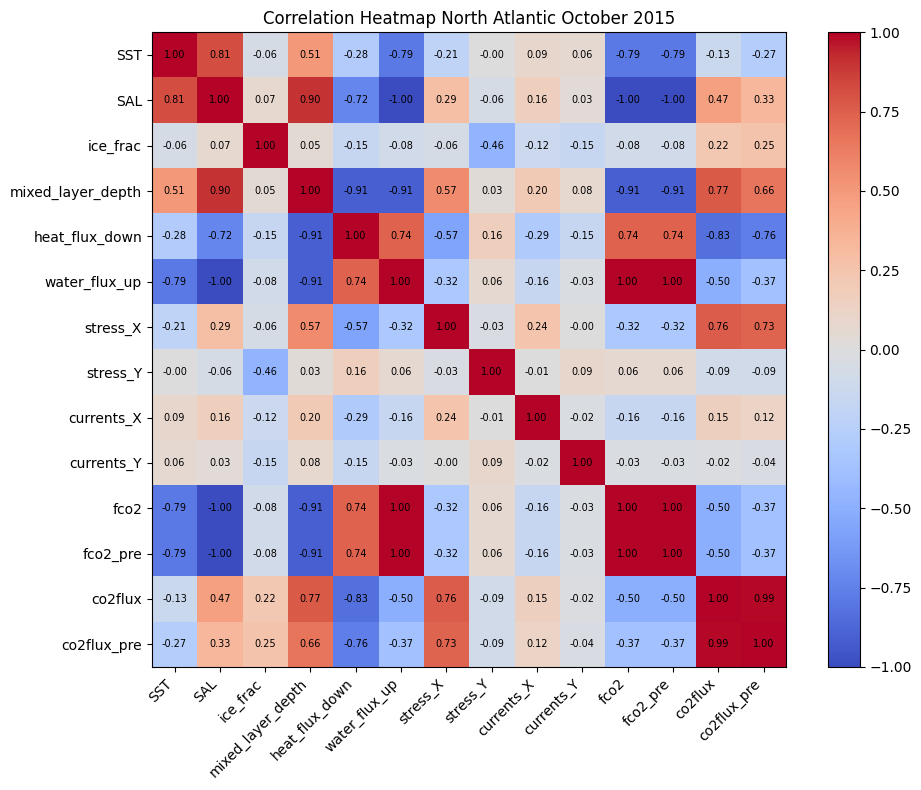

In [ ]:
df = corr_EQP

# Compute correlation matrix
corr_matrix = df.corr()

# Plot heatmap
fig, ax = plt.subplots(figsize=(10, 8))
cax = ax.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)

# Add colorbar
fig.colorbar(cax)

# Set ticks
ax.set_xticks(np.arange(len(features)))
ax.set_yticks(np.arange(len(features)))
ax.set_xticklabels(features, rotation=45, ha='right')
ax.set_yticklabels(features)

# Add correlation values in the cells
for i in range(len(features)):
    for j in range(len(features)):
        text = f"{corr_matrix.iloc[i, j]:.2f}"
        ax.text(j, i, text, ha='center', va='center', color='black', fontsize=7)

ax.set_title("Correlation Heatmap North Atlantic October 2015")
plt.tight_layout()
plt.savefig("../plots/general/heatmaps/heatmap_NA_OCT_2015.png", dpi=300, bbox_inches='tight')

In [ ]:
# Load the .pkl files into Pandas DataFrames

# data_2018 = pd.read_pickle('../../data/2018_df.pkl')
data_2009_exp_2 = pd.read_pickle("../../../../../../../Volumes/T7 Shield/exp_2/ORCA025.L46.LIM2vp.CFCSF6.MOPS.JRA.LP11-KLP009.hind_1977_df.pkl")
data_2009_exp_2.describe()

# data_2009 = data_2009[(data_2009['nav_lon'] == -79.5000000) & (data_2009['nav_lat'] == -45.5285873) & (data_2009['time_centered'] == '2009-01-16 12:00:00')]

# print (data_2009.shape)

# filtered_df = data_2009[data_2009['tmask'] == 1]

# # Compute min, max, and median of the 'Value' column
# min_value = filtered_df['fco2_pre'].min()
# max_value = filtered_df['fco2_pre'].max()
# median_value = filtered_df['fco2_pre'].median()

# # Display results
# print(f"Min: {min_value}, Max: {max_value}, Median: {median_value}")

# # Get the row where 'Value' is maximal
# max_row = filtered_df.loc[filtered_df['fco2_pre'].idxmax()]

# # Display result
# print(max_row)
# filtered_df = data_2009[(data_2009['tmask'] == 1)]
# filtered_df.describe()



,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,...,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
count,1.766738e+07,1.766738e+07,17667384,1.766738e+07,1.766738e+07,17667384,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,...,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,1.766738e+07,8.833692e+06,8.833692e+06,8.833692e+06,8.833692e+06
mean,5.100000e+02,7.205000e+02,1977-07-01 17:00:00.000001728,5.264113e-01,-1.061720e+00,1977-07-01 17:00:00.000001728,7.209844e+00,6.141242e-01,1.767752e+04,1.682089e+04,...,-3.173723e+00,3.051501e+16,1.119228e-02,-3.613204e-04,7.799447e-03,6.688457e-04,2.709021e+08,2.709021e+08,1.489762e-01,3.660398e-01
min,0.000000e+00,0.000000e+00,1977-01-16 12:00:00,-7.701048e+01,-1.800000e+02,1977-01-16 12:00:00,-2.071954e+00,0.000000e+00,1.459272e-01,3.068849e-08,...,-1.193517e+03,-5.565063e-02,-5.903083e-01,-6.311821e-01,-1.819894e+00,-3.156764e+00,2.379527e+01,2.379527e+01,-2.488656e+01,-2.687961e+01
25%,2.550000e+02,3.600000e+02,1977-04-08 09:00:00,-5.179231e+01,-9.507876e+01,1977-04-08 09:00:00,0.000000e+00,0.000000e+00,1.232506e+04,1.085933e+04,...,-1.366110e+01,-7.712923e-06,-4.696817e-03,-7.091782e-03,-3.164390e-03,-2.705834e-03,2.720351e+02,3.120302e+02,-7.191441e-02,-0.000000e+00
50%,5.100000e+02,7.205000e+02,1977-07-01 06:00:00,2.998630e+00,2.250000e+00,1977-07-01 06:00:00,0.000000e+00,1.000000e+00,1.716295e+04,1.584644e+04,...,0.000000e+00,2.472427e-05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.067457e+02,3.477455e+02,-0.000000e+00,-0.000000e+00
75%,7.650000e+02,1.081000e+03,1977-09-23 15:00:00,5.048521e+01,8.450333e+01,1977-09-23 15:00:00,1.508698e+01,1.000000e+00,2.400720e+04,2.375030e+04,...,1.152651e+01,7.928241e+16,1.806495e-02,6.336686e-03,7.313880e-03,4.543147e-03,7.020444e+08,7.020444e+08,2.351947e-01,6.366635e-01
max,1.020000e+03,1.441000e+03,1977-12-16 12:00:00,8.994787e+01,1.800000e+02,1977-12-16 12:00:00,3.390029e+01,1.000000e+00,2.779973e+04,2.779973e+04,...,2.963820e+02,7.928241e+16,3.720677e-01,4.903528e-01,1.917175e+00,2.206463e+00,7.020444e+08,7.020444e+08,1.338657e+01,1.492758e+01
std,2.947372e+02,4.162695e+02,NaN,5.205579e+01,1.026087e+02,NaN,1.063910e+01,4.868015e-01,6.683536e+03,7.174737e+03,...,7.113970e+01,3.857591e+16,5.973660e-02,3.252254e-02,9.023728e-02,5.758918e-02,3.417561e+08,3.417561e+08,1.012133e+00,1.150483e+00


In [7]:
data_2009 = data_2009[data_2009['tmask'] == 1]
data_2009.describe()

,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,...,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
count,1.084997e+07,1.084997e+07,10849968,1.084997e+07,1.084997e+07,10849968,1.084997e+07,10849968.0,1.084997e+07,1.084997e+07,...,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07,1.084997e+07
mean,4.454670e+02,7.112882e+02,2009-07-01 16:59:59.999990016,-1.101272e+01,-1.344753e+01,2009-07-01 16:59:59.999990016,1.187202e+01,1.0,1.900385e+04,1.895920e+04,...,-4.747459e+00,-5.687684e-06,1.882719e-02,-2.717637e-04,1.186453e-02,1.231927e-03,2.800223e+02,3.681677e+02,1.766815e-01,7.557669e-01
min,1.000000e+00,0.000000e+00,2009-01-16 12:00:00,-7.695416e+01,-1.800000e+02,2009-01-16 12:00:00,-2.066738e+00,1.0,5.622335e+03,3.171341e+03,...,-1.331313e+03,-6.429754e-02,-6.073705e-01,-5.195287e-01,-1.922913e+00,-2.847949e+00,2.395452e+01,2.395452e+01,-3.276862e+01,-3.743295e+01
25%,2.350000e+02,4.100000e+02,2009-04-08 09:00:00,-5.477985e+01,-1.112500e+02,2009-04-08 09:00:00,-9.004714e-02,1.0,1.318738e+04,1.357805e+04,...,-5.143566e+01,-1.844817e-05,-2.929903e-02,-2.223848e-02,-2.327221e-02,-1.535301e-02,2.597062e+02,3.477941e+02,-5.224639e-01,-1.382230e-01
50%,4.080000e+02,6.760000e+02,2009-07-01 06:00:00,-2.194304e+01,-2.500000e+01,2009-07-01 06:00:00,9.840953e+00,1.0,1.911156e+04,1.892998e+04,...,-1.632035e+00,-1.983722e-06,4.148231e-03,3.543382e-04,0.000000e+00,0.000000e+00,2.796953e+02,3.686152e+02,-4.875851e-03,2.758318e-01
75%,6.210000e+02,1.033000e+03,2009-09-23 15:00:00,2.938243e+01,7.950000e+01,2009-09-23 15:00:00,2.370286e+01,1.0,2.511921e+04,2.508433e+04,...,5.363225e+01,1.519581e-05,5.948425e-02,2.269954e-02,2.919382e-02,1.719949e-02,2.991278e+02,3.874661e+02,8.861237e-01,1.718580e+00
max,1.020000e+03,1.441000e+03,2009-12-16 12:00:00,8.994787e+01,1.800000e+02,2009-12-16 12:00:00,3.444878e+01,1.0,2.779973e+04,2.779973e+04,...,2.811281e+02,1.906341e-02,3.469968e-01,5.423833e-01,1.747139e+00,1.941530e+00,9.175321e+02,1.108075e+03,2.119527e+01,2.839714e+01
std,2.567375e+02,3.773010e+02,NaN,4.834989e+01,1.089453e+02,NaN,1.156584e+01,0.0,6.277548e+03,6.264017e+03,...,8.989861e+01,1.751743e-04,7.546546e-02,4.223228e-02,1.097392e-01,7.200842e-02,3.084730e+01,3.314372e+01,1.382461e+00,1.650667e+00


In [4]:
data_2009.head()

,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,...,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
0,0,0,2009-01-16 12:00:00,-77.010475,72.75,2009-01-16 12:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
1,0,0,2009-02-15 00:00:00,-77.010475,72.75,2009-02-15 00:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
2,0,0,2009-03-16 12:00:00,-77.010475,72.75,2009-03-16 12:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
3,0,0,2009-04-16 00:00:00,-77.010475,72.75,2009-04-16 00:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
4,0,0,2009-05-16 12:00:00,-77.010475,72.75,2009-05-16 12:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0


In [5]:
data_2018.head()

,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,...,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
0,0,0,2018-01-16 12:00:00,-77.010475,72.75,2018-01-16 12:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
1,0,0,2018-02-15 00:00:00,-77.010475,72.75,2018-02-15 00:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
2,0,0,2018-03-16 12:00:00,-77.010475,72.75,2018-03-16 12:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
3,0,0,2018-04-16 00:00:00,-77.010475,72.75,2018-04-16 00:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0
4,0,0,2018-05-16 12:00:00,-77.010475,72.75,2018-05-16 12:00:00,0.0,0,6248.626465,6248.626465,...,0.0,0.0,0.0,0.0,0.0,0.0,702044352.0,702044352.0,-0.0,-0.0


In [6]:
data_2018_shuffled = data_2018.sample(frac=1)
data_2018_shuffled.head()

,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,...,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
13175593,761,604,2018-02-15 00:00:00,52.330448,-134.706238,2018-02-15 00:00:00,7.835756,1,16559.238281,13663.738281,...,-94.074570,-2.030666e-05,0.093739,-0.033535,0.044452,0.018935,2.571103e+02,3.722068e+02,1.863256,2.218971
10795316,623,1243,2018-09-16 00:00:00,29.676823,23.513632,2018-09-16 00:00:00,0.000000,0,24153.562500,23175.175781,...,0.000000,7.928241e+16,0.000000,0.000000,0.000000,0.000000,7.020444e+08,7.020444e+08,-0.000000,-0.000000
8987494,519,559,2018-11-16 00:00:00,5.242669,-147.500000,2018-11-16 00:00:00,28.712217,1,27683.433594,27683.433594,...,-1.251944,-9.867739e-05,-0.038638,0.023754,0.253934,-0.046543,3.082819e+02,4.090853e+02,-0.927764,-0.503465
11916740,688,965,2018-09-16 00:00:00,42.854519,-46.198093,2018-09-16 00:00:00,16.851215,1,20553.976562,20534.271484,...,88.291634,5.997990e-05,-0.038387,-0.062074,0.083898,-0.142535,3.097238e+02,4.270811e+02,-1.557614,-1.284829
1877222,108,699,2018-03-16 12:00:00,-69.328667,-112.500000,2018-03-16 12:00:00,-1.799511,1,9813.494141,9813.494141,...,-5.680581,3.843765e-06,0.006027,0.040480,0.001199,-0.016294,2.753200e+02,3.709977e+02,0.150671,0.704349


In [18]:
# Convert 'time' column to datetime
data_2018['time_counter'] = pd.to_datetime(data_2018['time_counter'])

# Select data for a specific time
pd.set_option('display.max_columns', None)
specific_time = pd.to_datetime('2018-01-16 12:00')
filtered_df = data_2018[data_2018['time_counter'] == specific_time]
filtered_df.describe()

,y,x,time_counter,nav_lat,nav_lon,time_centered,SST,tmask,e1t,e2t,SAL,ice_frac,mixed_layer_depth,heat_flux_down,water_flux_up,stress_X,stress_Y,currents_X,currents_Y,fco2_pre,fco2,co2flux_pre,co2flux
count,1.472282e+06,1.472282e+06,1472282,1.472282e+06,1.472282e+06,1472282,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06,1.472282e+06
mean,5.100000e+02,7.205000e+02,2018-01-16 12:00:00,5.263779e-01,-1.061720e+00,2018-01-16 12:00:00,7.421791e+00,6.141242e-01,1.767752e+04,1.682089e+04,2.093475e+01,7.657566e-02,2.580277e+01,1.066190e+01,3.051552e+16,1.170824e-02,-4.860012e-03,6.243860e-03,6.497584e-05,2.709021e+08,2.709022e+08,3.235021e-01,8.587570e-01
min,0.000000e+00,0.000000e+00,2018-01-16 12:00:00,-7.701048e+01,-1.800000e+02,2018-01-16 12:00:00,-2.038417e+00,0.000000e+00,1.459272e-01,3.068849e-08,0.000000e+00,0.000000e+00,0.000000e+00,-9.254788e+02,-2.533816e-02,-3.888800e-01,-5.145247e-01,-1.408888e+00,-2.418323e+00,2.628733e+01,2.628733e+01,-2.407687e+01,-2.363673e+01
25%,2.550000e+02,3.600000e+02,2018-01-16 12:00:00,-5.179231e+01,-9.507864e+01,2018-01-16 12:00:00,0.000000e+00,0.000000e+00,1.232508e+04,1.085933e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.026769e-05,-6.548776e-03,-1.361567e-02,-4.060408e-03,-3.072525e-03,2.659226e+02,3.662238e+02,0.000000e+00,0.000000e+00
50%,5.100000e+02,7.205000e+02,2018-01-16 12:00:00,2.998630e+00,2.250000e+00,2018-01-16 12:00:00,0.000000e+00,1.000000e+00,1.716295e+04,1.584644e+04,3.318145e+01,0.000000e+00,1.451922e+01,0.000000e+00,2.775732e-05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.956926e+02,4.041162e+02,-0.000000e+00,-0.000000e+00
75%,7.650000e+02,1.081000e+03,2018-01-16 12:00:00,5.048519e+01,8.450317e+01,2018-01-16 12:00:00,1.606496e+01,1.000000e+00,2.400715e+04,2.375030e+04,3.443948e+01,0.000000e+00,3.332179e+01,7.817142e+01,7.928241e+16,1.739244e-02,1.988632e-03,7.031929e-03,4.350618e-03,7.020444e+08,7.020444e+08,5.351451e-01,1.809907e+00
max,1.020000e+03,1.441000e+03,2018-01-16 12:00:00,8.994787e+01,1.800000e+02,2018-01-16 12:00:00,3.233150e+01,1.000000e+00,2.779973e+04,2.779973e+04,4.212775e+01,1.000000e+00,6.218522e+02,2.832323e+02,7.928241e+16,3.409812e-01,1.986190e-01,1.573772e+00,1.360907e+00,7.020444e+08,7.020444e+08,1.252780e+01,1.830886e+01
std,2.947373e+02,4.162696e+02,NaN,5.205581e+01,1.026088e+02,NaN,1.064974e+01,4.868016e-01,6.683538e+03,7.174739e+03,1.668597e+01,2.437343e-01,3.915012e+01,9.504552e+01,3.857652e+16,6.198648e-02,3.433818e-02,8.127448e-02,5.721102e-02,3.417562e+08,3.417562e+08,1.161094e+00,1.675135e+00


In [16]:
# new_df = filtered_df[filtered_df['pre_fco2']< 0.00015]
# n_df = new_df[new_df['water_flux_up']> -0.00015]
# filtered_df = filtered_df[filtered_df['tmask'] == 1]
# plt.hist(filtered_df['water_flux_up'], bins=100, color='blue', edgecolor='black', alpha=1)

mean = np.mean(filtered_df['water_flux_up'])
std = np.std(filtered_df['water_flux_up'])
min_val = np.min(filtered_df['water_flux_up'])
max_val = np.max(filtered_df['water_flux_up'])

print(f"Training data: Mean: {mean:.4f}, Std: {std:.4f}, Min: {min_val:.4f}, Max: {max_val:.4f}")

Training data: Mean: -0.0000, Std: 0.0002, Min: -0.0643, Max: 0.0191


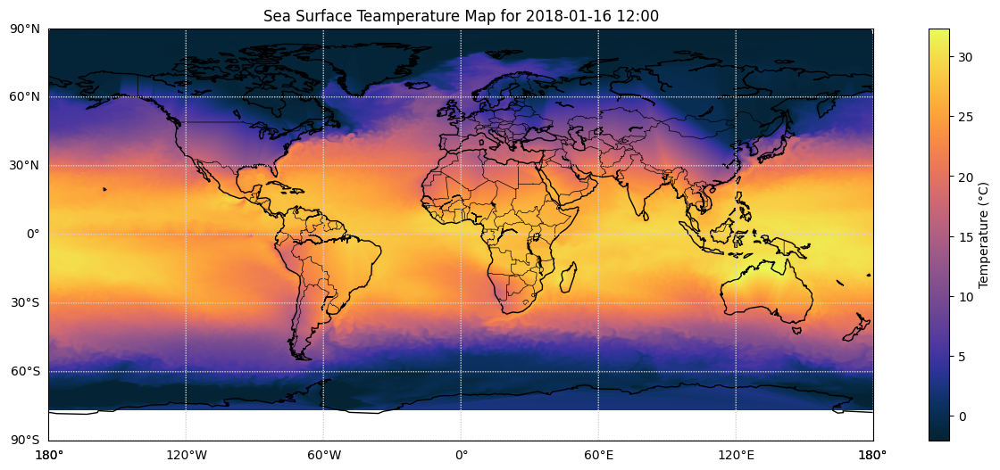

In [9]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['SST'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, cmap=cmocean.cm.thermal, shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.05)
cbar.set_label('Temperature (°C)')

plt.title(f"Sea Surface Teamperature Map for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

In [10]:
latitudes = np.linspace(-77, 90, 180)
longitudes = np.linspace(-180, 180, 360)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['SAL'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=30, urcrnrlat=60,
            llcrnrlon=-0, urcrnrlon=30,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin='0', vmax='40', cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Salinity (g/kg)')

plt.title(f"Salinity Map for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

KeyboardInterrupt: 

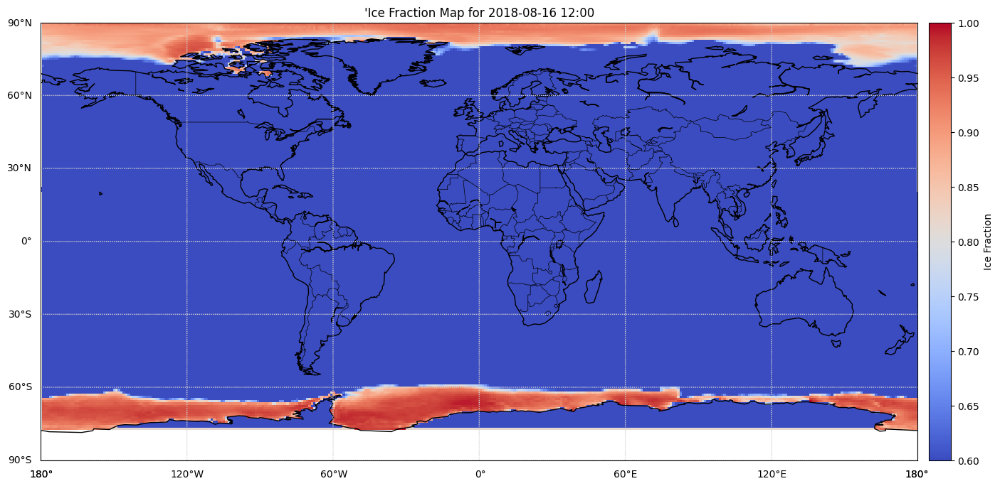

In [ ]:
latitudes = np.linspace(-77, 90, 180)
longitudes = np.linspace(-180, 180, 360)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['ice_frac'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(20, 8))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin=0.6, vmax=1, cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Ice Fraction')

plt.title(f"'Ice Fraction Map for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

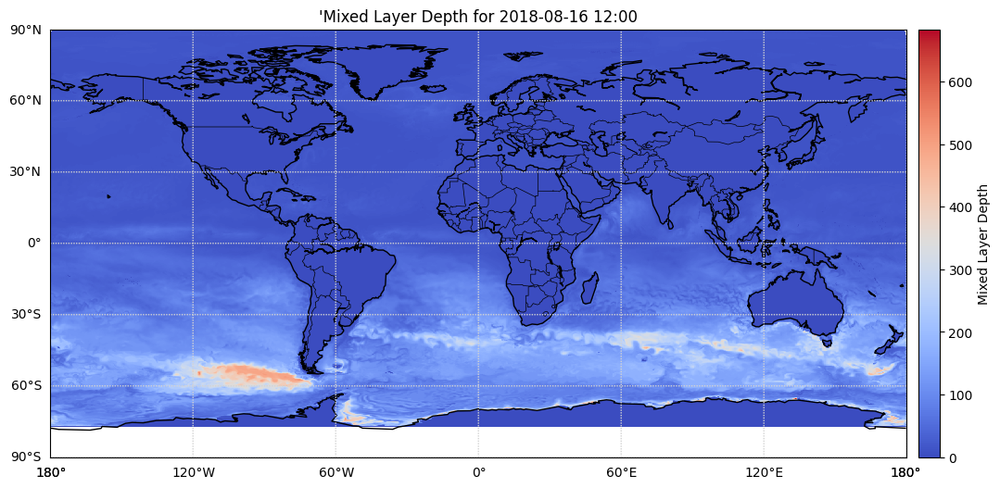

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['mixed_layer_depth'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(20, 8))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Mixed Layer Depth')

plt.title(f"'Mixed Layer Depth for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

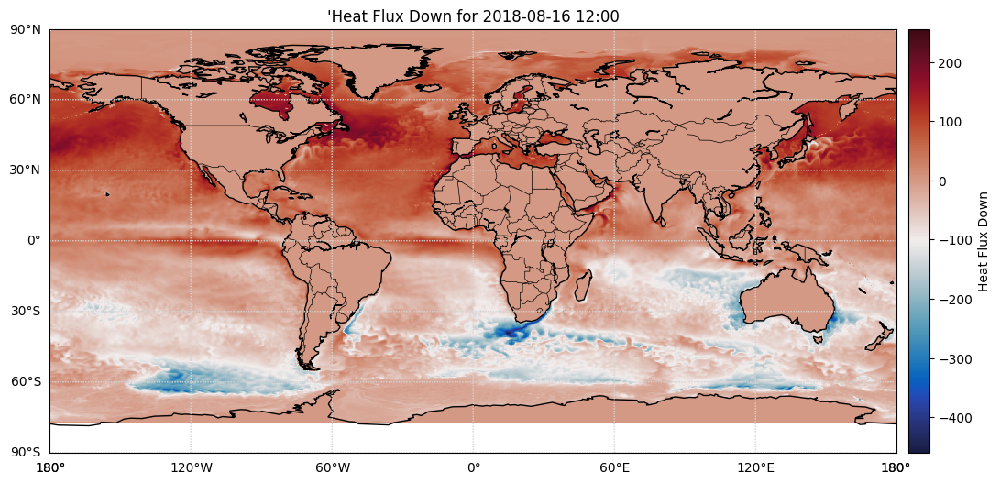

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['heat_flux_down'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(20, 8))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, cmap=cmocean.cm.balance, shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Heat Flux Down')

plt.title(f"'Heat Flux Down for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

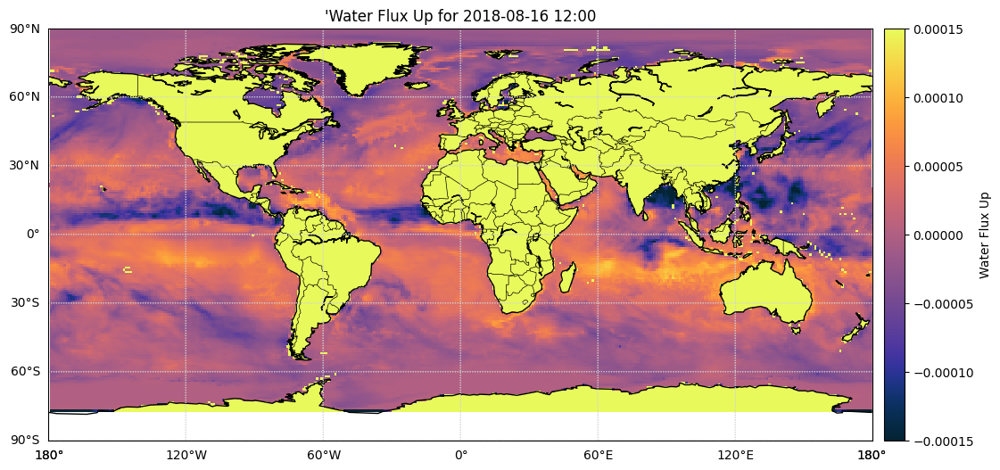

In [ ]:
latitudes = np.linspace(-77, 90, 180)
longitudes = np.linspace(-180, 180, 360)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['water_flux_up'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(20, 8))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin=-0.00015, vmax=0.00015, cmap=cmocean.cm.thermal, shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Water Flux Up')

plt.title(f"'Water Flux Up for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

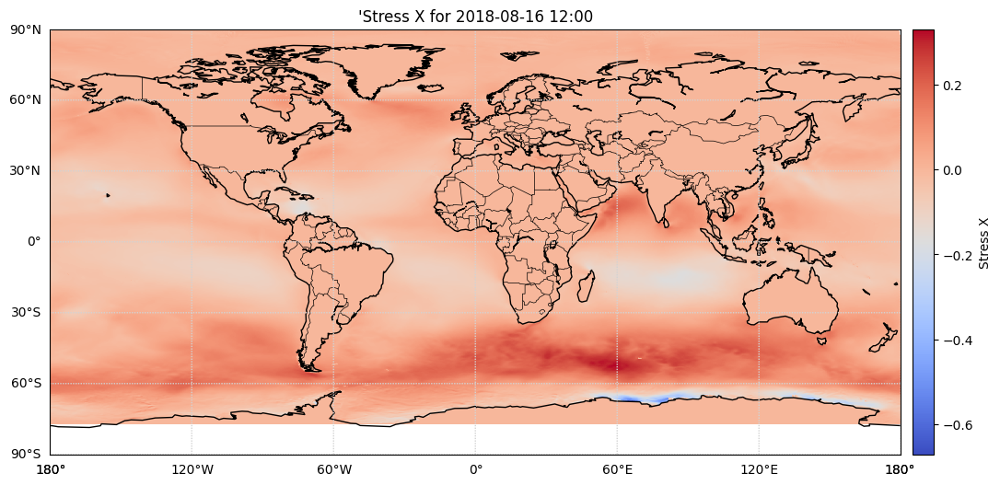

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['stress_X'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Stress X')

plt.title(f"'Stress X for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

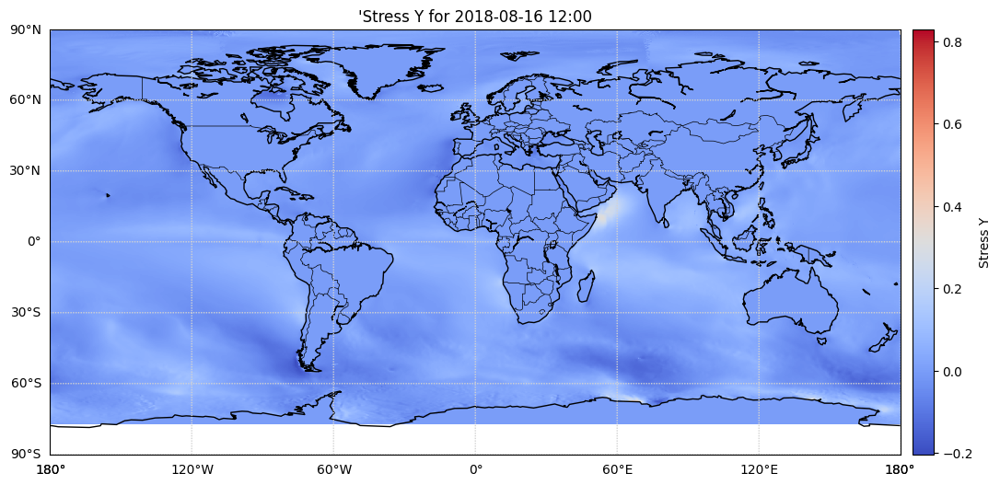

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['stress_Y'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Stress Y')

plt.title(f"'Stress Y for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

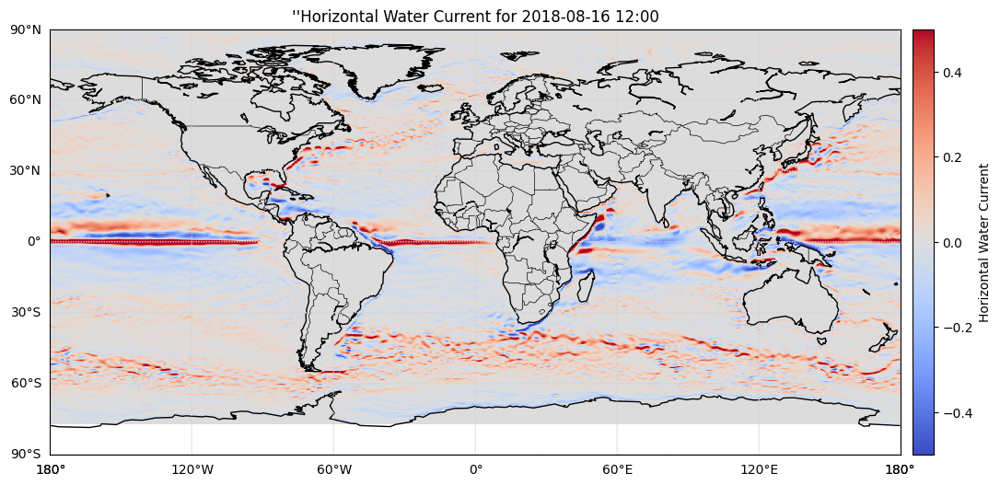

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['currents_X'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin='-0.5', vmax='0.5', cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Horizontal Water Current')

plt.title(f"''Horizontal Water Current for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

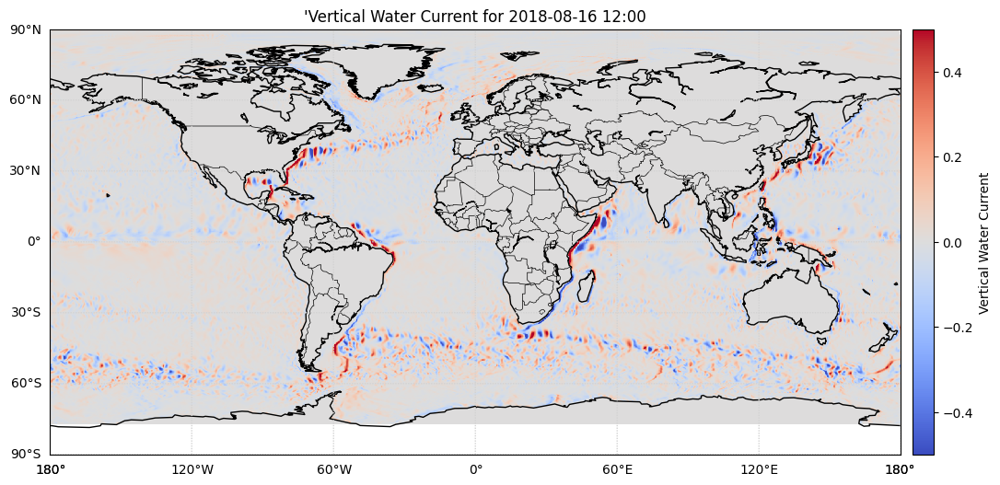

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['currents_Y'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin='-0.5', vmax='0.5', cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Vertical Water Current')

plt.title(f"'Vertical Water Current for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

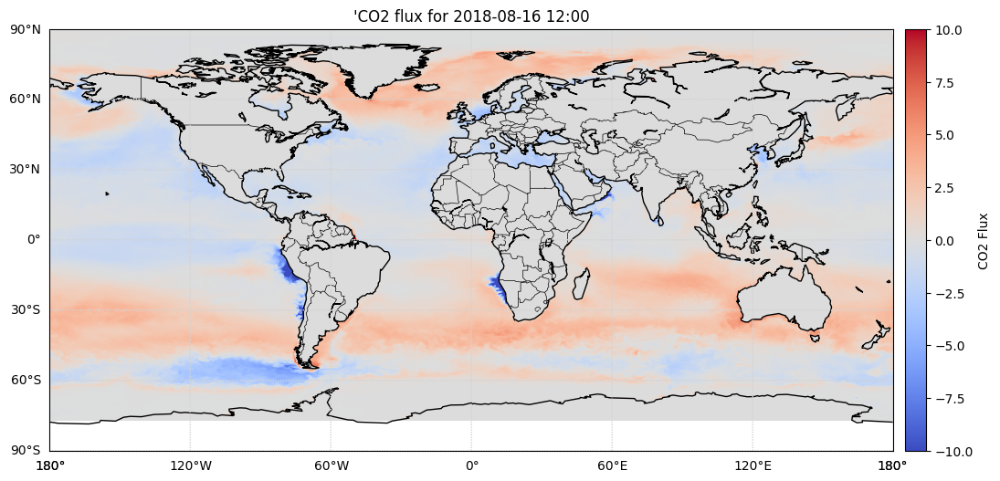

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['co2flux'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin='-10', vmax='10', cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('CO2 Flux')

plt.title(f"'CO2 flux for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

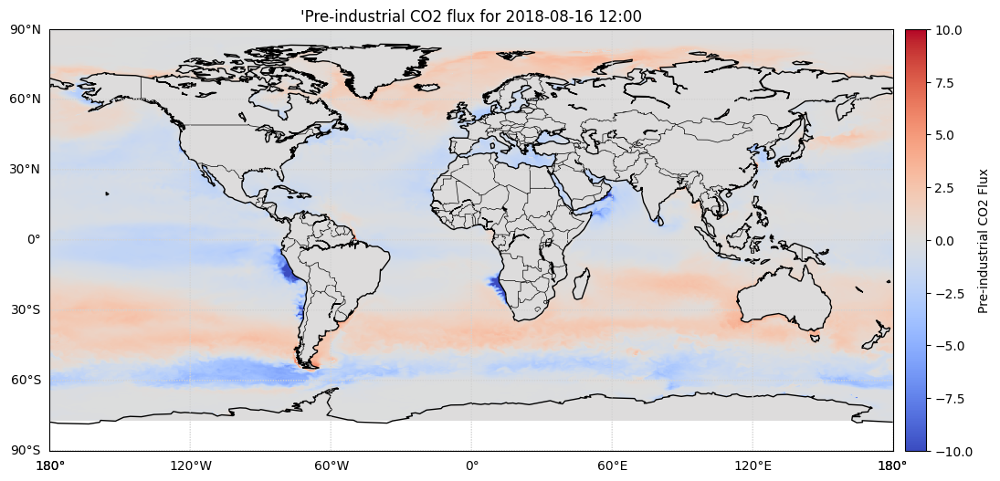

In [ ]:
latitudes = np.linspace(-77, 90, 1020)
longitudes = np.linspace(-180, 180, 1440)
lon_grid, lat_grid = np.meshgrid(longitudes, latitudes)

# Interpolate temperature data onto the grid
from scipy.interpolate import griddata

temperature_grid = griddata(
    points=(filtered_df['nav_lon'].values, filtered_df['nav_lat'].values),
    values=filtered_df['co2flux_pre'].values,
    xi=(lon_grid, lat_grid),
    method='linear'
)

# Plot using Basemap
plt.figure(figsize=(16, 6))

# Create a Basemap instance for the whole world
m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")


pcm = m.pcolormesh(lon_grid, lat_grid, temperature_grid, vmin='-10', vmax='10', cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Pre-industrial CO2 Flux')

plt.title(f"'Pre-industrial CO2 flux for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()

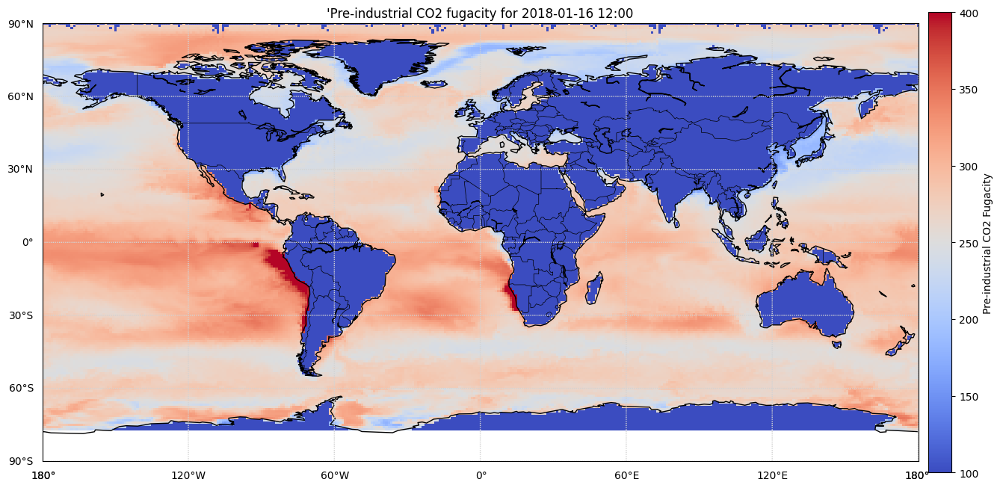

In [11]:
just_ocean = filtered_df[filtered_df['tmask'] == 1]

# Define map boundaries
lat_min, lat_max = -77, 90
lon_min, lon_max = -180, 180

# Create a grid
num_lat, num_lon = 180, 360  # Grid resolution
lat_grid = np.linspace(lat_min, lat_max, num_lat)
lon_grid = np.linspace(lon_min, lon_max, num_lon)
lon_grid, lat_grid = np.meshgrid(lon_grid, lat_grid)

# Initialize grid with zeros
grid_values = np.zeros_like(lat_grid)

# Map DataFrame values to the grid
# Find the closest grid point for each latitude/longitude in the DataFrame
for _, row in just_ocean.iterrows():
    lat_idx = np.argmin(np.abs(lat_grid[:, 0] - row['nav_lat']))
    lon_idx = np.argmin(np.abs(lon_grid[0, :] - row['nav_lon']))
    grid_values[lat_idx, lon_idx] = row['fco2_pre']

plt.figure(figsize=(18, 8))

m = Basemap(projection='cyl',
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180,
            resolution='c')

m.drawcoastlines()
m.drawcountries()
m.drawparallels(range(-90, 91, 30), labels=[True, False, False, False], color="lightgrey")
m.drawmeridians(range(-180, 181, 60), labels=[False, False, False, True], color="lightgrey")

# Map grid lat/lon to Basemap coordinates
x, y = m(lon_grid, lat_grid)


pcm = m.pcolormesh( x, y, grid_values,  vmin='100', vmax='400', cmap='coolwarm', shading='auto', latlon=True)
cbar = plt.colorbar(pcm, orientation='vertical', pad=0.01)
cbar.set_label('Pre-industrial CO2 Fugacity')

plt.title(f"'Pre-industrial CO2 fugacity for {specific_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()